# Create SSP Data for Simulation

In [1]:
import xarray as xr
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
#from oceans.sw_extras import sw_extras as sw
import numpy.matlib
from dask.distributed import Client
import hvplot.xarray
from tqdm import tqdm
from numpy import matlib

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 14
plt.rcParams['text.usetex']=True

#### Make print statement untruncated

In [12]:
import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)

#### start dask client

In [2]:
client = Client()
print(client.dashboard_link)

http://127.0.0.1:8787/status


### Open HYCOM Data

In [3]:
fn = '/datadrive/HYCOM_data/AxialSeamount_Caldera.nc'
hycom = xr.open_dataset(fn)

In [4]:
# create grid of depth values

depth_hycom = xr.DataArray(
    np.matlib.repmat(hycom.depth, hycom.sizes['time'], 1).T,
    dims=list(hycom.dims.keys()),
    coords=hycom.coords,
    name='depth'
)

In [5]:
hycom_ssp = sw.soundspeed(hycom.salinity, hycom.water_temp, depth_hycom)

#### Explore Sound Speed Profile

In [84]:
ssp_mean = ssp.loc[:,175:].mean('time')
ssp_std = ssp.loc[:,175:].std('time')

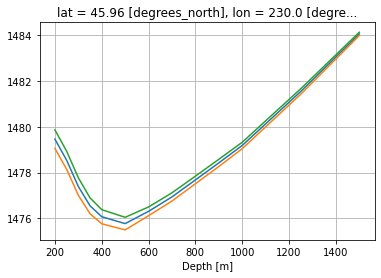

In [63]:
ssp_mean.plot()
(ssp_mean-ssp_std/2).plot()
(ssp_mean+ssp_std/2).plot()
plt.grid()

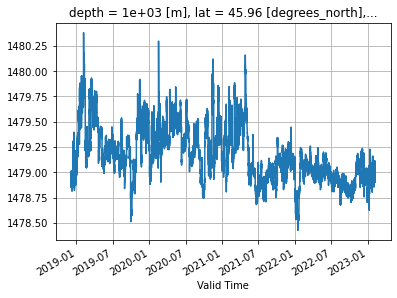

In [61]:
depth_idx = np.argmin(np.abs(ssp.depth.values - 1000))
ssp[:,depth_idx].plot()
plt.grid()

### Open CTD Data

In [3]:
fn = '/datadrive/CTD_data/data_explorer/gridded_CTD.nc'
ctd = xr.open_dataset(fn)

In [4]:
# create grid of depth values

depth_ctd = xr.DataArray(
    np.matlib.repmat(ctd.depth, ctd.sizes['time'], 1).T,
    dims=list(ctd.dims.keys()),
    coords=ctd.coords,
    name='depth'
)

In [5]:
ctd_ssp = sw.soundspeed(
    ctd['sea_water_practical_salinity_profiler_depth_enabled'],
    ctd['sea_water_temperature_profiler_depth_enabled'],
    depth_ctd
)

ctd_ssp = ctd_ssp.assign_coords({'depth':-1*ctd_ssp.depth})

In [6]:
ctd_ssp = ctd_ssp.loc[:, 20:180]

#### visualize ctd data

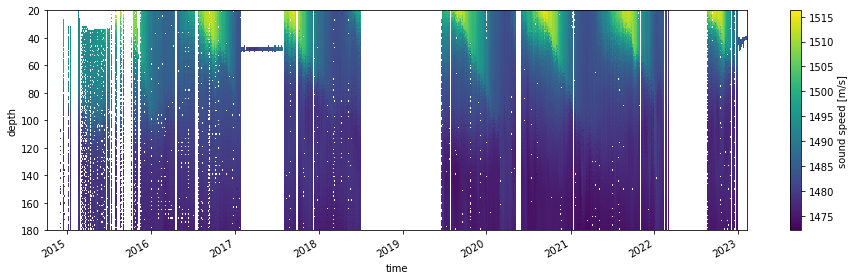

In [8]:
fig = plt.figure(figsize=(13,4))
ax = plt.gca()
ctd_ssp.plot(x='time', y='depth', ax=ax, cbar_kwargs={'label':'sound speed [m/s]'})
plt.ylim([180,20])

plt.tight_layout()
#fig.savefig('figures/ctd.png', dpi=300)

# Clean up CTD Data

In [7]:
# Create mask for profiles that have fewer than 25 nan values, and have a value for 20 and 180 m depth
nan_mask = np.isnan(ctd_ssp)
nan_mask_depth = nan_mask.sum('depth')
threshold_mask = nan_mask_depth > 50
shallow_mask = nan_mask[:,0]
deep_mask = nan_mask[:,-1]
time_series_mask = ~(threshold_mask | shallow_mask | deep_mask)

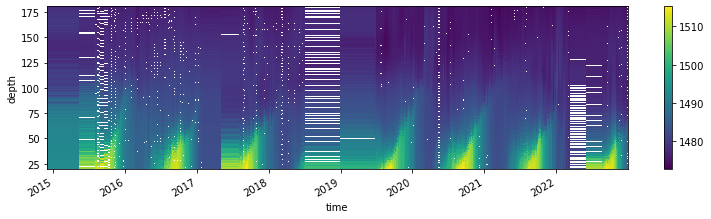

In [47]:
plt.figure(figsize=(13,3))
ctd_ssp[time_series_mask,:].plot(x='time')

In [8]:
ctd_ssp_interp = ctd_ssp[time_series_mask,:].interpolate_na(dim='depth', method='cubic', max_gap=10)

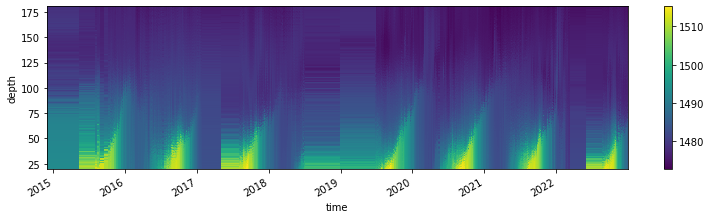

In [53]:
plt.figure(figsize=(13,3))
ctd_ssp_interp.plot(x='time')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


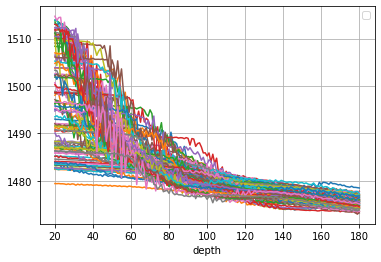

In [61]:
ctd_ssp_interp[::20,:].plot.line(x='depth')
plt.legend()
plt.grid()

In [9]:
ctd_ssp_interp

<xarray.DataArray (time: 1742, depth: 161)>
array([[1493.02503779, 1492.9506247 , 1492.97029477, ..., 1478.62747783,
        1478.56256415, 1478.50265615],
       [1508.3816841 , 1509.30543852, 1510.24986068, ..., 1477.67583169,
        1477.36137736, 1477.47817458],
       [1511.89030232, 1511.71679098, 1512.02239021, ..., 1477.24408649,
        1477.22288634, 1477.22062624],
       ...,
       [1486.26773331, 1486.51673418, 1486.39919305, ..., 1474.36406187,
        1474.15337179, 1473.91630648],
       [1486.29259516, 1486.28690848, 1486.117795  , ..., 1474.03404768,
        1474.08708793, 1474.0617788 ],
       [1485.6179051 , 1485.55827527, 1485.63237158, ..., 1473.8959385 ,
        1473.83313084, 1473.8726015 ]])
Coordinates:
  * depth    (depth) int64 20 21 22 23 24 25 26 ... 174 175 176 177 178 179 180
  * time     (time) datetime64[ns] 2015-02-19 2015-07-29 ... 2022-12-30

### Combine with Deep Profiler Mean

In [10]:
fn = '/datadrive/old_data/soundspeed_deep.nc'
ssp_deep_1d = xr.open_dataarray(fn)

- Not completely sure how I calculated this deep profile, but I believe it's primarily from ~ august 2019
- I am deciding to using the deep profiler from 200 m and below, so there is a 20 m strech of the ocean that doesn't have data and will just be interpolated

(130.0, 300.0)

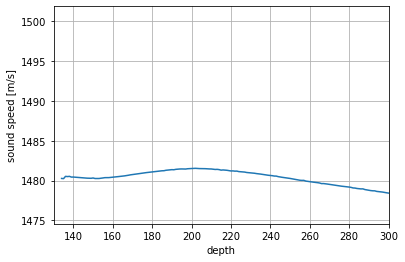

In [12]:
ssp_deep_1d.plot()
plt.grid()
plt.xlim([130,300])

In [13]:
# repmat to match shallow dimensions
ssp_deep_rep = np.matlib.repmat(ssp_deep_1d, ctd_ssp_interp.shape[0], 1)
ssp_deep = xr.DataArray(ssp_deep_rep, dims=['time', 'depth'], coords={'time':ctd_ssp_interp.time, 'depth':ssp_deep_1d.depth}).loc[:,200:1550]
ssp_stitched = xr.concat((ctd_ssp_interp, ssp_deep), dim='depth')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 1.0, 'visualization of boundary interpolation')

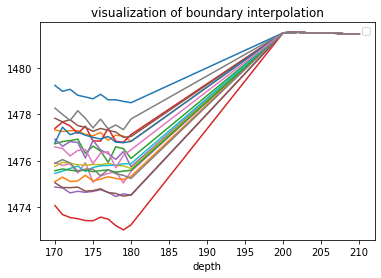

In [28]:
ssp_stitched.loc[:,170:210][::100,:].plot.line(x='depth')
plt.legend()
plt.title('visualization of boundary interpolation')

In [30]:
fn = '/datadrive/CTD_data/stitched_2015_2023.nc'
ssp_stitched.to_netcdf(fn)

# HYCOM and CTD

### Concatenate HYCOM and CTD

#### create day average hycom data

In [10]:
start_time = pd.Timestamp('2018-12-05')
end_time = pd.Timestamp('2023-01-01')

n_days = (end_time - start_time).days

time_coord = []
for k in range(n_days):
    start = start_time + pd.Timedelta(days=k)
    time_coord.append(start)
    
hycom_ssp_day = xr.DataArray(np.ones((n_days, hycom_ssp.shape[1]))*np.nan, dims=['time', 'depth'], coords={'depth':hycom_ssp.depth, 'time':time_coord})

for k in tqdm(range(n_days)):
    start = start_time + pd.Timedelta(days=k)
    end = start + pd.Timedelta(days=1)
    
    hycom_ssp_day[k,:] = hycom_ssp.loc[start:end,:].mean('time').values

100%|████████████████████████████████████████████████████████████████████████████| 1488/1488 [00:01<00:00, 989.29it/s]


In [11]:
ssp = xr.concat(
    (
        ctd_ssp.loc[hycom_ssp_day.time[0]:pd.Timestamp('2022-12-31'), :150],
        hycom_ssp_day.loc[:pd.Timestamp('2023-01-01'), 150:]
    ),
    dim='depth'
)

### Create plots for comparing CTD to HYCOM

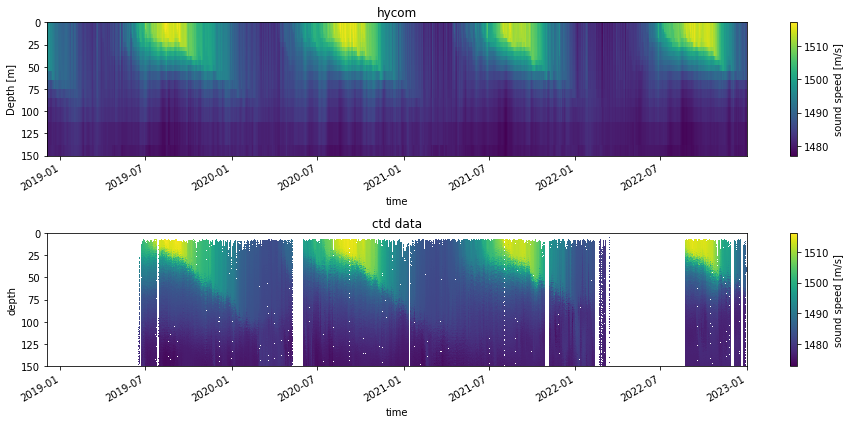

In [12]:
fig, axes = plt.subplots(2,1,figsize=(13,6))
axes = axes.flatten()

plt.sca(axes[0])
hycom_ssp_day.loc[:,:180].plot(ax=axes[0], x='time', y='depth', cbar_kwargs=dict(label='sound speed [m/s]'))
plt.ylim([150,0])
plt.title('hycom')

plt.sca(axes[1])
ctd_ssp.loc[hycom_ssp_day.time[0].values:pd.Timestamp('2023-01-01'),:180].plot(ax=axes[1], x='time', y='depth', cbar_kwargs=dict(label='sound speed [m/s]'))
plt.ylim([150,0])
plt.title('ctd data')
plt.tight_layout()

fig.savefig('figures/hycom_vs_ctd.png', dpi=300)

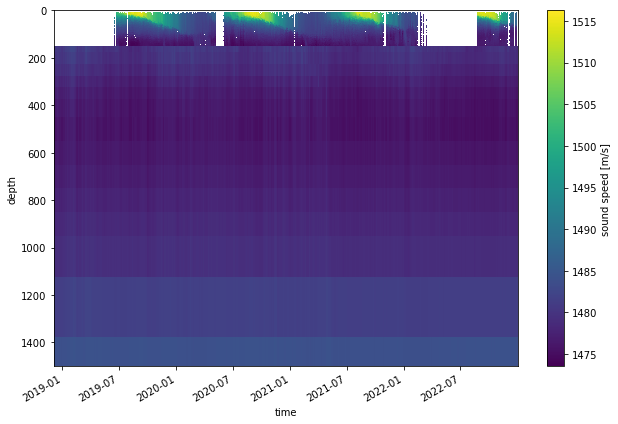

In [18]:
plt.subplots(figsize=(9,6))
plt.title('Assimilated Data')
ssp.plot(x='time', y='depth', cbar_kwargs=dict(label='sound speed [m/s]'))
plt.ylim([1500,0])

plt.tight_layout()
plt.savefig('figures/DA_ctd_hycom.png', dpi=300)

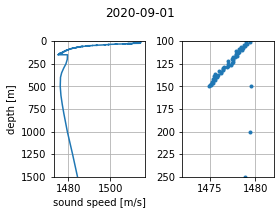

In [15]:
fig, axes = plt.subplots(1,2,figsize=(4,3))
fig.suptitle('2020-09-01')
axes = axes.flatten()

plt.sca(axes[0])

plt.plot(ssp.loc[pd.Timestamp('2020-09-01'),:], ssp.depth)
plt.ylim([1500,0])
plt.grid()
plt.ylabel('depth [m]')
plt.xlabel('sound speed [m/s]')

plt.sca(axes[1])
plt.plot(ssp.loc[pd.Timestamp('2020-09-01'),:], ssp.depth, '.')
plt.ylim([250,100])
plt.xlim([1472, 1482])
plt.grid()
plt.tight_layout()

plt.savefig('figures/DA_profile_sept.png', dpi=300)

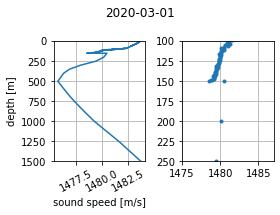

In [16]:
fig, axes = plt.subplots(1,2,figsize=(4,3))
fig.suptitle('2020-03-01')
axes = axes.flatten()

plt.sca(axes[0])

plt.plot(ssp.loc[pd.Timestamp('2020-03-01'),:], ssp.depth)
plt.ylim([1500,0])
plt.grid()
plt.ylabel('depth [m]')
plt.xlabel('sound speed [m/s]')
plt.xticks(rotation = 28)

plt.sca(axes[1])
plt.plot(ssp.loc[pd.Timestamp('2020-03-01'),:], ssp.depth, '.')
plt.ylim([250,100])
plt.xlim([1475, 1487])
plt.grid()
plt.tight_layout()

plt.savefig('figures/DA_profile_march.png', dpi=300)

# Debug CTD data

In [7]:
fn = '/datadrive/old_data/axial_base_onlyprofilers.nc'

In [8]:
da = xr.open_dataarray(fn)

In [10]:
da.depth

<xarray.DataArray 'depth' (depth: 3000)>
array([   0,    1,    2, ..., 2997, 2998, 2999])
Coordinates:
  * depth    (depth) int64 0 1 2 3 4 5 6 ... 2993 2994 2995 2996 2997 2998 2999

In [9]:
da.hvplot.image(x='dates', y='depth', rasterize=True)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


:DynamicMap   []
   :Image   [dates,depth]   (Axial Base SSP)

- I found some bugs in the original only profilers data
- Fixed bugs and also updated the data to go to april 2023

# Create gridded CTD data for simulation

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import hvplot.xarray
from numpy import matlib

In [2]:
fn = '/datadrive/CTD_data/axial_base_onlyprofilers.nc'
ssp_raw = xr.open_dataarray(fn)

fn = '/datadrive/CTD_data/deep_profile_mean.nc'
ssp_mean = xr.open_dataarray(fn)

In [3]:
ssp_shallow = ssp_raw.loc[pd.Timestamp('2015-01-01'):pd.Timestamp('2023-01-01'),12:180]

#### figures

In [4]:
ssp_shallow.hvplot.image(x='time', rasterize=True)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


:DynamicMap   []
   :Image   [time,depth]   (CTD SSP (only profilers))

## Stitch together deep and shallow profiles

In [57]:
nan_mask = (np.isnan(ssp_shallow[:,0]) | np.isnan(ssp_shallow[:,-1]))
ssp_shallow_valid = ssp_shallow[~nan_mask,:]

mean_slice = ssp_mean.loc[190:]
depth_coord = np.hstack((ssp_shallow_valid.depth.values, mean_slice.depth.values))
time_coord = ssp_shallow_valid.time

mean_rep = xr.DataArray(matlib.repmat(mean_slice.values, ssp_shallow_valid.sizes['time'],1), dims=['time', 'depth'], coords={'time':time_coord, 'depth':mean_slice.depth}, name='stitched CTD ssp') 

In [25]:
ssp_stitched = xr.concat((ssp_shallow_valid, mean_rep), dim='depth')

In [56]:
fn = '/datadrive/CTD_data/stitched_2015_2023_ooipy.nc'
ssp_stitched.to_netcdf(fn)

#### figures

In [3]:
fn = '/datadrive/CTD_data/stitched_2015_2023_ooipy.nc'
ssp_stitched = xr.open_dataarray(fn)

In [7]:
fn = '/datadrive/CTD_data/axial_base_onlyprofilers.nc'
ssp_full = xr.open_dataarray(fn)

In [8]:
ssp_stitched.hvplot(y='depth', width=300, height=400, grid=True, ylim=(400,0), xlim=(1470, 1515), xlabel='sound speed [m/s]', rot=30)

:DynamicMap   [time]
   :Curve   [CTD SSP (only profilers)]   (depth)

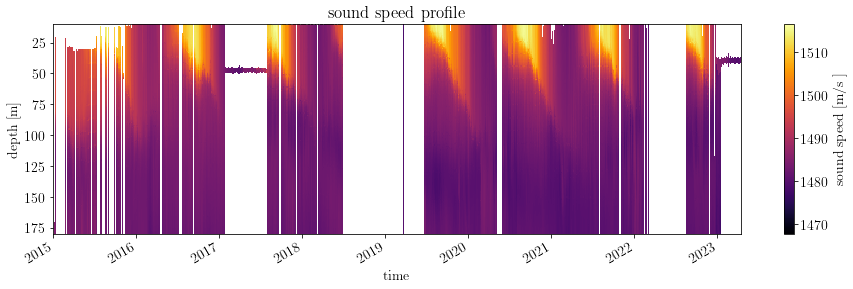

In [12]:
fig = plt.figure(figsize=(13,4))
ssp_full.plot(y='depth', cmap='inferno', ylim=(180,10), cbar_kwargs={'label':'sound speed  [m/s ]'})
plt.ylabel('depth $\\left[ \\mathrm{m} \\right ]$')
plt.tight_layout()
plt.title('sound speed profile')

fig.savefig('figures/ssp_shallow.png', dpi=300)